In [7]:
import pandas as pd
import numpy as np
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline

In [8]:
result1 = np.stack([np.load(f'F:\\minowa\\BloodPressureEstimation\\notebooks\\outputs\\resnet\\0415_2class_cv_res18mini2\\predictions_proba_fold{i}.npy') for i in range(5)])
result2 = np.stack([np.load(f"F:\\minowa\\BloodPressureEstimation\\repos\\hydra-bp-classifier\\checkpoints\\resnet\\0425_vit_2\\predictions_proba_fold{i}.npy") for i in range(5)])
true = np.stack([np.load(f'F:\\minowa\\BloodPressureEstimation\\notebooks\\outputs\\resnet\\0415_2class_cv_res18mini2\\true_labels_fold{i}.npy') for i in range(5)])
predicted1 = np.argmax(result1,axis=2)
predicted2 = np.argmax(result2,axis=2)
count = np.zeros(38110)
for i in range(5):
    wrong=(np.where(predicted1[i] != true[i])[0]) 
    count[wrong] += 1
    wrong=(np.where(predicted2[i] != true[i])[0])
    count[wrong] += 1 
correct_0 = np.where(count == 0)[0]
correct_10 = np.where(count == 10)[0]


In [10]:
len(correct_0), len(correct_10)

(23093, 2921)

In [9]:
new_arr = np.where(count == 0, 0, np.where(count == 10, 2, 1))
np.unique(new_arr, return_counts=True)

(array([0, 1, 2]), array([23093, 12096,  2921], dtype=int64))

In [ ]:
df["target_DBP"].value_counts()

In [11]:
df = pd.read_csv("../data/results/ppg_features_pulsedb_2class.csv", index_col=0)
df.head()

,Tc,Ts,Td,Tsteepest,Steepest,TNegSteepest,NegSteepest,TdiaRise,DiaRise,SteepDiaRise,TSystoDiaRise,TdiaToEnd,Ratio,Ts_norm,Td_norm,Tsteepest_norm,TNegSteepest_norm,TdiaRise_norm,TSystoDiaRise_norm,TdiaToEnd_norm,SW25,SW25_norm,DW25,DW25_norm,SWaddDW25,SWaddDW25_norm,DWdivSW25,SW50,SW50_norm,DW50,DW50_norm,SWaddDW50,SWaddDW50_norm,DWdivSW50,SW75,SW75_norm,DW75,DW75_norm,SWaddDW75,SWaddDW75_norm,DWdivSW75,S1,S2,S3,S4,AUCsys,AUCdia,S1_norm,S2_norm,S3_norm,S4_norm,AUCsys_norm,AUCdia_norm,SQI_skew,SQI_kurtosis,apg_a,apg_b,apg_c,apg_d,apg_e,ppg_a,ppg_b,ppg_c,ppg_d,ppg_e,ratio_apg_b,ratio_apg_c,ratio_apg_d,ratio_apg_e,ratio_ppg_b,ratio_ppg_c,ratio_ppg_d,ratio_ppg_e,T_a,T_b,T_c,T_d,T_e,T_a_norm,T_b_norm,T_c_norm,T_d_norm,T_e_norm,T_peak_a,T_peak_b,T_peak_c,T_peak_d,T_peak_e,T_peak_a_norm,T_peak_b_norm,T_peak_c_norm,T_peak_d_norm,T_peak_e_norm,AI,bd,bcda,sdoo,signal_index
0,0.602667,0.199467,0.403200,0.109867,0.069232,0.282667,-0.036287,0.397333,0.251511,-0.021276,0.197867,0.205333,3.991819,0.330971,0.669029,0.182281,0.469088,0.659322,0.328351,0.340678,0.117333,0.194713,0.194667,0.323018,0.312000,0.517731,1.661270,0.086933,0.144269,0.132267,0.219474,0.219200,0.363743,1.523030,0.056533,0.093813,0.079467,0.131871,0.136000,0.225684,1.407143,1.710870,8.042748,15.726451,2.502099,9.753618,18.228549,0.175427,0.824573,0.862532,0.137468,0.348671,0.651329,0.470405,0.586326,0.006800,-0.008833,-0.005365,-0.004830,0.001025,0.206632,0.976412,0.883091,0.857086,0.409747,-1.299400,-0.791170,-0.712289,0.151401,4.759020,4.309180,4.178462,1.997639,0.055467,0.114133,0.052800,0.009600,0.106667,0.092012,0.189380,0.087708,0.015942,0.176889,0.144000,0.029867,0.022933,0.032533,0.139200,0.238959,0.049579,0.038129,0.054070,0.230959,0.052658,-0.006411,0.204059,0.042465,0
1,0.625067,0.187733,0.437333,0.114667,0.067494,0.239467,-0.046734,0.362133,0.334255,-0.005830,0.174400,0.262933,2.815313,0.299922,0.700078,0.182863,0.382854,0.579047,0.279124,0.420953,0.110400,0.176847,0.291200,0.465787,0.401600,0.642634,2.653141,0.075733,0.121475,0.104533,0.167736,0.180267,0.289211,1.385556,0.048533,0.077801,0.056000,0.089885,0.104533,0.167686,1.160000,1.878717,5.805008,11.462449,5.583104,7.683725,17.045553,0.240525,0.759475,0.674629,0.325371,0.310457,0.689543,0.764064,0.419075,0.007241,-0.011142,-0.006649,-0.006616,0.004738,0.231720,0.905894,0.812451,0.785533,0.427011,-1.706476,-0.819976,-0.824826,0.696241,4.239096,3.763280,3.639394,2.021795,0.052800,0.107200,0.043200,0.011200,0.074133,0.083626,0.171940,0.068410,0.017988,0.119366,0.134933,0.027733,0.015467,0.026667,0.100800,0.216296,0.044357,0.024053,0.042041,0.161407,-0.757915,-0.009360,-0.061673,0.060499,1
2,0.633067,0.206933,0.426133,0.133333,0.064063,0.259733,-0.042810,0.385600,0.376757,-0.006321,0.178667,0.247467,2.561044,0.324606,0.675394,0.203671,0.411406,0.609236,0.284629,0.390764,0.163733,0.256417,0.342400,0.550054,0.506133,0.806471,2.437814,0.080000,0.130556,0.117333,0.191675,0.197333,0.322231,1.470640,0.050133,0.081882,0.060800,0.099583,0.110933,0.181466,1.220317,1.562623,5.073070,9.898937,4.083443,6.635693,13.982379,0.222343,0.777657,0.724313,0.275687,0.327887,0.672113,0.852086,0.408848,0.006840,-0.009736,-0.002146,-0.002424,0.004245,0.266359,0.863423,0.694706,0.651604,0.430429,-1.680402,-0.307117,-0.335972,0.812535,3.419363,2.716299,2.519480,1.698060,0.028800,0.132800,0.063467,0.013333,0.055467,0.045693,0.194775,0.097181,0.020870,0.090384,0.178133,0.045333,0.018133,0.031467,0.086933,0.278913,0.084138,0.013043,0.033912,0.124297,-1.849847,NaN,-1.037312,0.116373,2
3,0.660571,0.168571,0.492000,0.096000,0.069803,0.219429,-0.048235,0.347429,0.332146,-0.004913,0.178857,0.313143,2.907305,0.254728,0.745272,0.144577,0.331954,0.526546,0.271819,0.473454,0.108000,0.163931,0.307429,0.465349,0.415429,0.629279,2.860283,0.074286,0.112753,0.102857,0.155783,0.177143,0.268536,1.384127,0.047429,0.072040,0.054857,0.083274,0.102286,0.155314,1.157143,1.447213,5.504671,10.907753,5.324490,6.951884,16.232243,0.206365,0.793635,0.677408,0.322592

In [13]:
df['label'] = new_arr[df['signal_index'].values]

In [15]:
df.head()

,Tc,Ts,Td,Tsteepest,Steepest,TNegSteepest,NegSteepest,TdiaRise,DiaRise,SteepDiaRise,TSystoDiaRise,TdiaToEnd,Ratio,Ts_norm,Td_norm,Tsteepest_norm,TNegSteepest_norm,TdiaRise_norm,TSystoDiaRise_norm,TdiaToEnd_norm,SW25,SW25_norm,DW25,DW25_norm,SWaddDW25,SWaddDW25_norm,DWdivSW25,SW50,SW50_norm,DW50,DW50_norm,SWaddDW50,SWaddDW50_norm,DWdivSW50,SW75,SW75_norm,DW75,DW75_norm,SWaddDW75,SWaddDW75_norm,DWdivSW75,S1,S2,S3,S4,AUCsys,AUCdia,S1_norm,S2_norm,S3_norm,S4_norm,AUCsys_norm,AUCdia_norm,SQI_skew,SQI_kurtosis,apg_a,apg_b,apg_c,apg_d,apg_e,ppg_a,ppg_b,ppg_c,ppg_d,ppg_e,ratio_apg_b,ratio_apg_c,ratio_apg_d,ratio_apg_e,ratio_ppg_b,ratio_ppg_c,ratio_ppg_d,ratio_ppg_e,T_a,T_b,T_c,T_d,T_e,T_a_norm,T_b_norm,T_c_norm,T_d_norm,T_e_norm,T_peak_a,T_peak_b,T_peak_c,T_peak_d,T_peak_e,T_peak_a_norm,T_peak_b_norm,T_peak_c_norm,T_peak_d_norm,T_peak_e_norm,AI,bd,bcda,sdoo,signal_index,label
0,0.602667,0.199467,0.403200,0.109867,0.069232,0.282667,-0.036287,0.397333,0.251511,-0.021276,0.197867,0.205333,3.991819,0.330971,0.669029,0.182281,0.469088,0.659322,0.328351,0.340678,0.117333,0.194713,0.194667,0.323018,0.312000,0.517731,1.661270,0.086933,0.144269,0.132267,0.219474,0.219200,0.363743,1.523030,0.056533,0.093813,0.079467,0.131871,0.136000,0.225684,1.407143,1.710870,8.042748,15.726451,2.502099,9.753618,18.228549,0.175427,0.824573,0.862532,0.137468,0.348671,0.651329,0.470405,0.586326,0.006800,-0.008833,-0.005365,-0.004830,0.001025,0.206632,0.976412,0.883091,0.857086,0.409747,-1.299400,-0.791170,-0.712289,0.151401,4.759020,4.309180,4.178462,1.997639,0.055467,0.114133,0.052800,0.009600,0.106667,0.092012,0.189380,0.087708,0.015942,0.176889,0.144000,0.029867,0.022933,0.032533,0.139200,0.238959,0.049579,0.038129,0.054070,0.230959,0.052658,-0.006411,0.204059,0.042465,0,0
1,0.625067,0.187733,0.437333,0.114667,0.067494,0.239467,-0.046734,0.362133,0.334255,-0.005830,0.174400,0.262933,2.815313,0.299922,0.700078,0.182863,0.382854,0.579047,0.279124,0.420953,0.110400,0.176847,0.291200,0.465787,0.401600,0.642634,2.653141,0.075733,0.121475,0.104533,0.167736,0.180267,0.289211,1.385556,0.048533,0.077801,0.056000,0.089885,0.104533,0.167686,1.160000,1.878717,5.805008,11.462449,5.583104,7.683725,17.045553,0.240525,0.759475,0.674629,0.325371,0.310457,0.689543,0.764064,0.419075,0.007241,-0.011142,-0.006649,-0.006616,0.004738,0.231720,0.905894,0.812451,0.785533,0.427011,-1.706476,-0.819976,-0.824826,0.696241,4.239096,3.763280,3.639394,2.021795,0.052800,0.107200,0.043200,0.011200,0.074133,0.083626,0.171940,0.068410,0.017988,0.119366,0.134933,0.027733,0.015467,0.026667,0.100800,0.216296,0.044357,0.024053,0.042041,0.161407,-0.757915,-0.009360,-0.061673,0.060499,1,0
2,0.633067,0.206933,0.426133,0.133333,0.064063,0.259733,-0.042810,0.385600,0.376757,-0.006321,0.178667,0.247467,2.561044,0.324606,0.675394,0.203671,0.411406,0.609236,0.284629,0.390764,0.163733,0.256417,0.342400,0.550054,0.506133,0.806471,2.437814,0.080000,0.130556,0.117333,0.191675,0.197333,0.322231,1.470640,0.050133,0.081882,0.060800,0.099583,0.110933,0.181466,1.220317,1.562623,5.073070,9.898937,4.083443,6.635693,13.982379,0.222343,0.777657,0.724313,0.275687,0.327887,0.672113,0.852086,0.408848,0.006840,-0.009736,-0.002146,-0.002424,0.004245,0.266359,0.863423,0.694706,0.651604,0.430429,-1.680402,-0.307117,-0.335972,0.812535,3.419363,2.716299,2.519480,1.698060,0.028800,0.132800,0.063467,0.013333,0.055467,0.045693,0.194775,0.097181,0.020870,0.090384,0.178133,0.045333,0.018133,0.031467,0.086933,0.278913,0.084138,0.013043,0.033912,0.124297,-1.849847,NaN,-1.037312,0.116373,2,0
3,0.660571,0.168571,0.492000,0.096000,0.069803,0.219429,-0.048235,0.347429,0.332146,-0.004913,0.178857,0.313143,2.907305,0.254728,0.745272,0.144577,0.331954,0.526546,0.271819,0.473454,0.108000,0.163931,0.307429,0.465349,0.415429,0.629279,2.860283,0.074286,0.112753,0.102857,0.155783,0.177143,0.268536,1.384127,0.047429,0.072040,0.054857,0.083274,0.102286,0.155314,1.157143,1.447213,5.504671,10.907753,5.324490,6.951884,16.232243,0.206365,0.793635,0.677

In [25]:
a = np.array(df.label.value_counts())
_,b = np.unique(new_arr, return_counts=True)
a,b,a/b

(array([18377,  9670,  2471], dtype=int64),
 array([23093, 12096,  2921], dtype=int64),
 array([0.79578227, 0.79943783, 0.84594317]))

In [18]:
df.to_csv("../data/results/ppg_features_pulsedb_2class_resnetLabel.csv")

In [14]:
target_variable = "label"
# target_variable = "target_DBP"

Shape of your Data Set loaded: (30518, 100)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
  Printing up to 30 columns (max) in each category:
    Numeric Columns : ['Tc', 'Ts', 'Td', 'Tsteepest', 'Steepest', 'TNegSteepest', 'NegSteepest', 'TdiaRise', 'DiaRise', 'SteepDiaRise', 'TSystoDiaRise', 'TdiaToEnd', 'Ratio', 'Ts_norm', 'Td_norm', 'Tsteepest_norm', 'TNegSteepest_norm', 'TdiaRise_norm', 'TSystoDiaRise_norm', 'TdiaToEnd_norm', 'SW25', 'SW25_norm', 'DW25', 'DW25_norm', 'SWaddDW25', 'SWaddDW25_norm', 'DWdivSW25', 'SW50', 'SW50_norm', 'DW50']
    Integer-Categorical Columns: []
    String-Categorical Columns: []
    Factor-Categorical Columns: []
    String-Boolean Columns: []
    Numeric-Boolean Columns: []
    Discrete String Column

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Ratio,float64,0.000000,NA,1.030786,42.145836,Column has 2030 outliers greater than upper bound (6.70) or lower than lower bound(-0.13). Cap them or remove them.
Td,float64,0.000000,NA,0.133600,1.601600,Column has 357 outliers greater than upper bound (0.96) or lower than lower bound(0.16). Cap them or remove them.
T_peak_b_norm,float64,0.000000,NA,0.013559,0.815450,Column has 2550 outliers greater than upper bound (0.09) or lower than lower bound(0.00). Cap them or remove them.
Tsteepest,float64,0.000000,NA,0.066105,1.382000,Column has 3533 outliers greater than upper bound (0.20) or lower than lower bound(0.02). Cap them or remove them.
SWaddDW50_norm,float64,0.000000,NA,0.111505,0.877499,Column has 297 outliers greater than upper bound (0.53) or lower than lower bound(0.11). Cap them or remove them.
T_d_norm,float64,0.000000,NA,0.000000,0.130832,Column has 31 outliers greater than upper bound (0.10) or lower than lower bound(-0.04). Cap them or remove them.
AUCsys,float64,0.000000,NA,4.670463,64.023020,Column has 2146 outliers greater than upper bound (13.65) or lower than lower bound(4.67). Cap them or remove them.
ppg_e,float64,0.000000,NA,0.008540,0.866760,Column has 907 outliers greater than upper bound (0.74) or lower than lower bound(0.05). Cap them or remove them.
AI,float64,0.000000,NA,-64.426556,38.093361,Column has 2540 outliers greater than upper bound (2.96) or lower than lower bound(-3.63). Cap them or remove them.
DWdivSW25,float64,0.000000,NA,0.124744,8.514423,Column has 641 outliers greater than upper bound (4.35) or lower than lower bound(0.40). Cap them or remove them.


Total Number of Scatter Plots = 105
Could not draw some Distribution Plots 'numpy.int64' object has no attribute 'startswith'
All Plots are saved in .\AutoViz_Plots\label
Time to run AutoViz = 44 seconds 


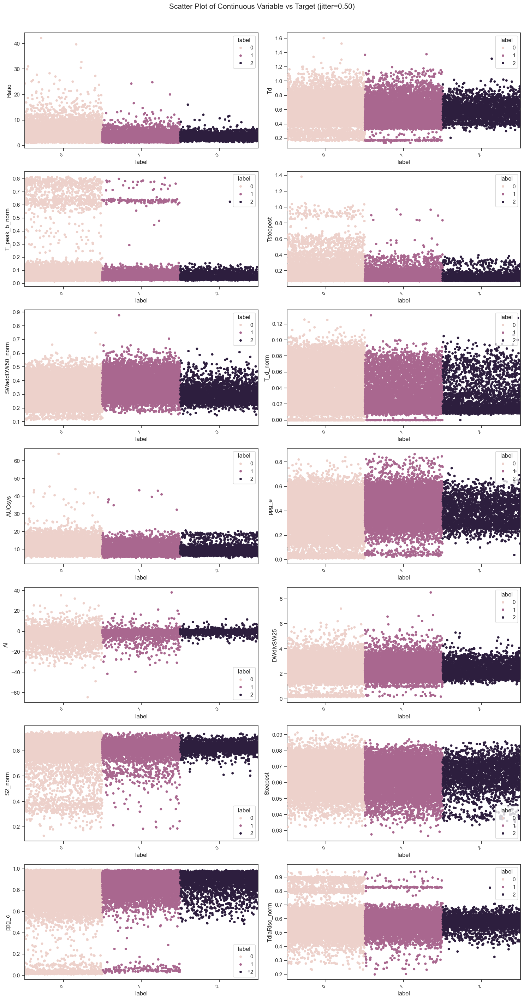

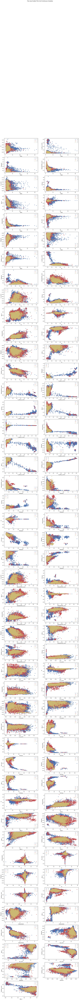

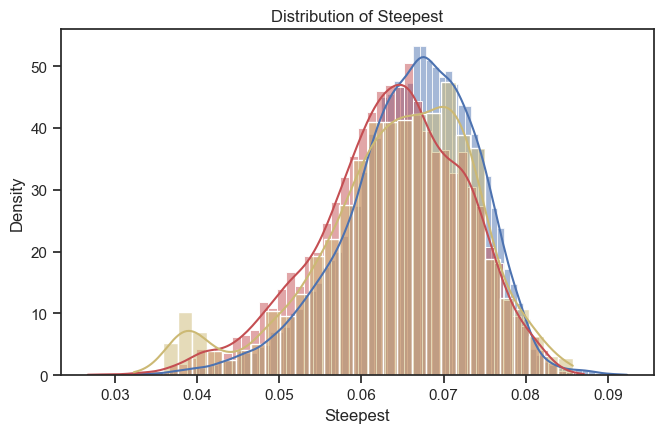

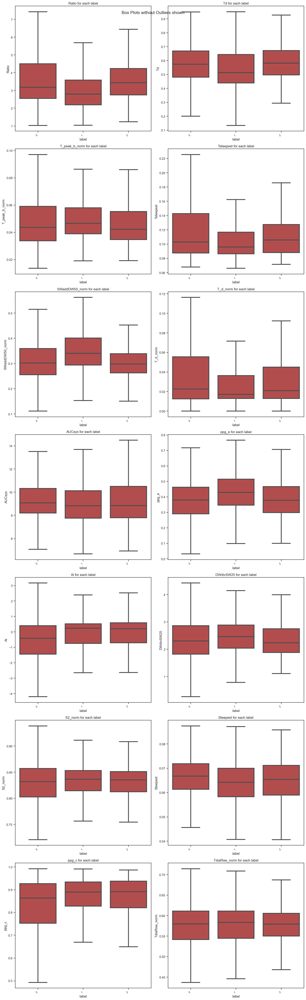

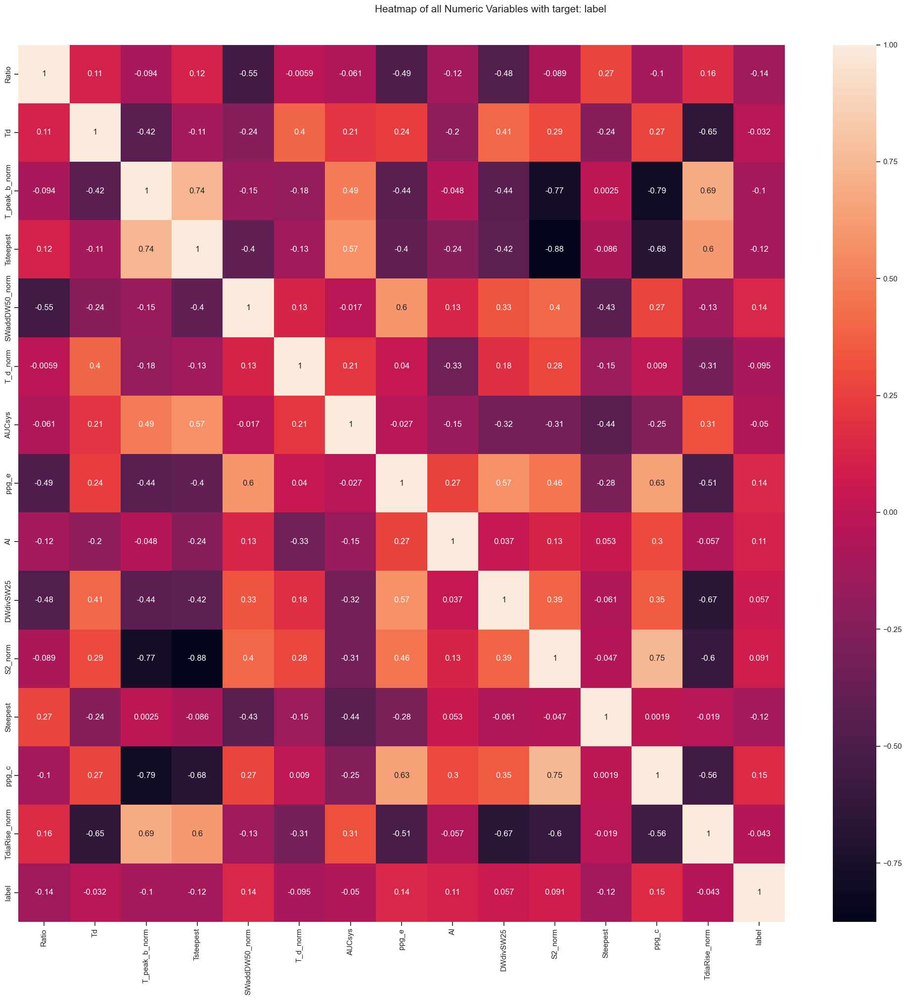

In [19]:
autoviz = AutoViz_Class().AutoViz("../data/results/ppg_features_pulsedb_2class_resnetLabel.csv",depVar=target_variable,verbose=2,max_cols_analyzed=40,chart_format ='png')

# stats

In [ ]:
target_variable = "target_SBP"

In [ ]:
autoviz = AutoViz_Class().AutoViz("../data/results/stats_features.csv",depVar=target_variable,verbose=2,max_cols_analyzed=40,chart_format ='png')